In [7]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.patches as patches

import os
os.chdir("/Users/deweywang/Desktop/GitHub/HEVisum/")


# Training data preparation 

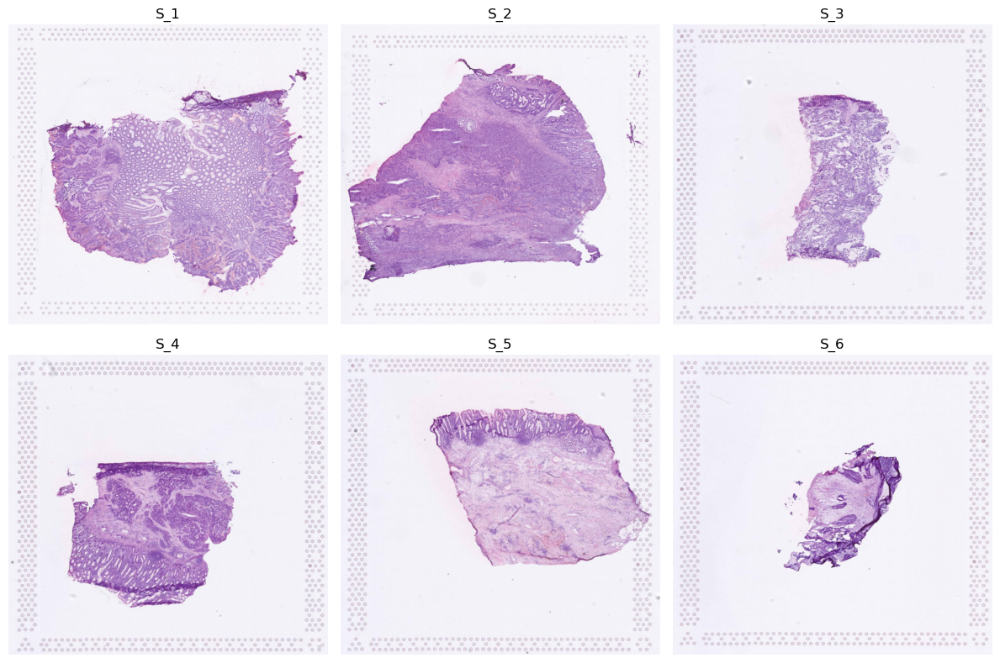

In [ ]:
import math
import numpy as np
import h5py
import matplotlib.pyplot as plt

# Open the HDF5 file and load the Train images and spots datasets
with h5py.File("./dataset/elucidata_ai_challenge_data.h5", "r") as h5file:
    train_images = h5file["images/Train"]
    train_spots = h5file["spots/Train"]

    # Get a list of all sample keys (slide identifiers)
    samples = list(train_images.keys())
    n_samples = len(samples)
    
    # Determine grid size (roughly square)
    cols = math.ceil(math.sqrt(n_samples))
    rows = math.ceil(n_samples / cols)
    
    # Create a figure with a grid of subplots
    fig, axs = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    # In case there's only one subplot, make it iterable
    axs = axs.flatten() if n_samples > 1 else [axs]
    
    # Loop through each sample and plot the corresponding data
    for ax, sample in zip(axs, samples):
        image = np.array(train_images[sample])
        spots = np.array(train_spots[sample])
        x, y = spots["x"], spots["y"]

        ax.imshow(image, aspect="auto")
        ax.scatter(x, y, color="red", s=1, alpha=0.4)
        ax.axis('off')
        ax.set_title(sample)
        
    # Hide any unused subplots (if the grid is larger than needed)
    for ax in axs[len(samples):]:
        ax.set_visible(False)
    
    plt.tight_layout()
    plt.show()


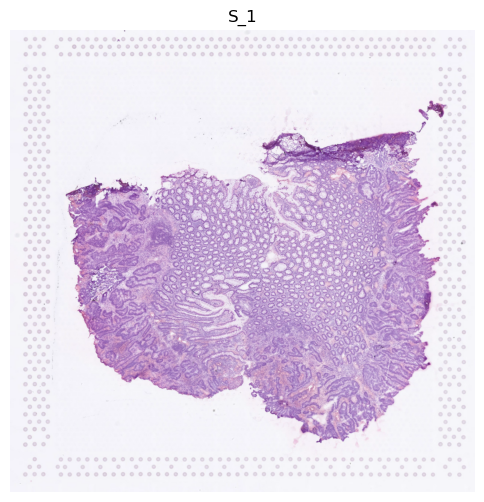

In [6]:
with h5py.File("./dataset/elucidata_ai_challenge_data.h5", "r") as h5file:
    train_images = h5file["images/Train"]
    train_spots = h5file["spots/Train"]
    
    sample = 'S_1'
    image = np.array(train_images[sample])
    spots = np.array(train_spots[sample])
    x, y = spots["x"], spots["y"]
    
    plt.figure(figsize=(6,6))
    plt.imshow(image, aspect="auto")
    #plt.scatter(x, y, color="red", s=1, alpha=0.4)
    plt.axis('off')
    plt.title(sample)
    plt.show()

## Training data augmentation

In [10]:

# Load and display (x,y) spot locations and cell type annotation table for Train slides
with h5py.File("./dataset/elucidata_ai_challenge_data.h5", "r") as f:
    train_spots = f["spots/Train"]
    
    # Dictionary to store DataFrames for each slide
    train_spot_tables = {}
    
    for slide_name in train_spots.keys():
        # Load dataset as NumPy structured array
        spot_array = np.array(train_spots[slide_name])
        
        # Convert to DataFrame
        df = pd.DataFrame(spot_array)
        
        # Store in dictionary
        train_spot_tables[slide_name] = df
        print(slide_name)

# Example: Display the spots table for slide 'S_1'
train_spot_tables['S_1']

S_1
S_2
S_3
S_4
S_5
S_6


,x,y,C1,C2,C3,C4,C5,C6,C7,C8,...,C26,C27,C28,C29,C30,C31,C32,C33,C34,C35
0,1554,1297,0.014401,0.057499,0.022033,0.001704,0.533992,1.511707,0.015313,0.020029,...,1.009572e-03,2.068237,0.121361,0.007344,0.000017,0.036891,0.035934,0.118937,0.001472,0.050057
1,462,1502,0.116196,0.197176,0.110600,0.042614,5.587681,0.006885,0.096346,0.001711,...,6.918171e-04,0.014442,0.000238,0.024071,0.000023,0.217589,0.100662,0.004027,0.004122,0.049491
2,1488,1548,0.133284,0.035880,0.061352,0.003073,1.104479,0.009174,0.009175,0.000114,...,9.577447e-05,0.149792,0.001401,0.000699,0.000009,0.024491,0.018810,0.004171,0.000425,0.015348
3,1725,1182,0.087715,0.235223,0.090382,0.013902,8.760482,0.140912,0.188859,0.010154,...,1.964150e-03,0.142549,0.002036,0.047165,0.000022,0.180372,0.202981,0.003709,0.001845,0.116022
4,581,1113,0.128468,0.066399,0.098982,0.047022,3.425771,0.001009,0.026881,0.000468,...,7.189078e-05,0.005920,0.000048,0.006359,0.000585,0.052661,0.032168,0.000107,0.000107,0.013103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2192,1055,701,0.047236,0.112721,0.052490,0.002092,0.000913,0.393805,0.045220,0.013414,...,7.530558e-03,0.559967,0.154793,0.133587,0.000013,0.051041,0.113100,0.003147,0.004971,0.128265
2193,1225,862,0.070764,0.119310,0.193938,0.001239,0.003851,0.588956,0.037731,0.004072,...,3.219223e-02,0.667076,0.094247,0.136623,0.000009,0.050518,0.119685,0.027743,0.016413,0.287171
2194,765,1479,0.194491,0.048068,0.150061,0.002978,0.119206,0.000213,0.005332,0.000078,...,2.628421e-04,0.000273,0.000022,0.000027,0.000042,0.029386,0.019977,0.000039,0.000119,0.006778
2195,607,1525,0.002968,0.151899,0.015931,0.000071,1.354983,0.000152,0.019254,0.001267,...,1.377452e-03,0.003754,0.001420,0.088000,0.000536,0.073240,0.113631,0.009040,0.000090,0.025716


## Smooth spots

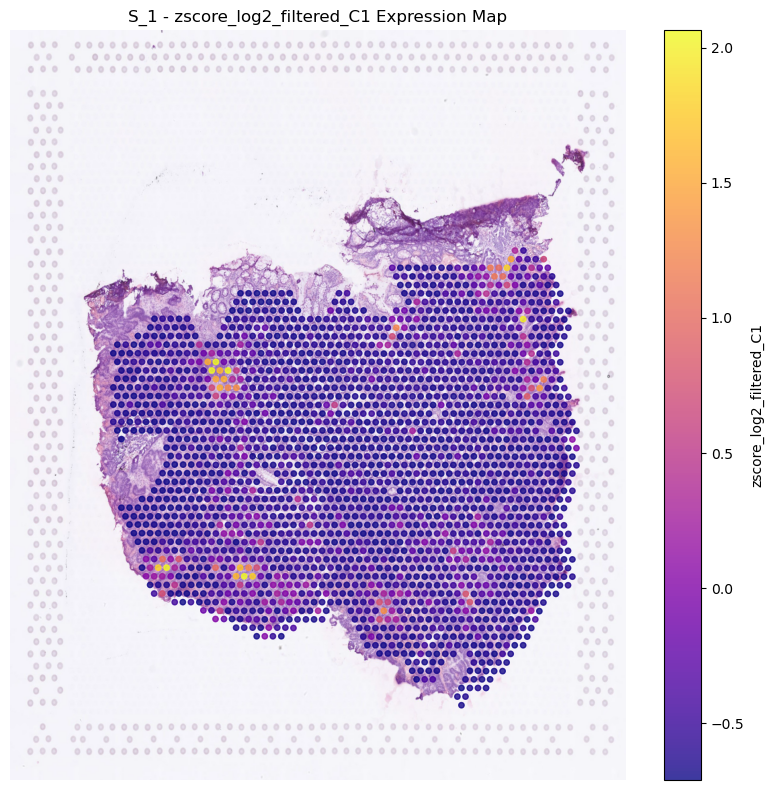

In [ ]:
from python_scripts.expression_plot_utils import plot_cell_expression_on_slide
plot_cell_expression_on_slide(
    slide_id = "S_1",
    cell_type = "C1",
    cell_prefix="zscore_log2_filtered_",  # or zscore_boxcox_filtered_
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="./dataset/processed_train_spots.h5",
    group_name="log2_Train"
)

/Users/deweywang/Desktop/GitHub/HEVisum/python_scripts/expression_plot_utils.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 1])


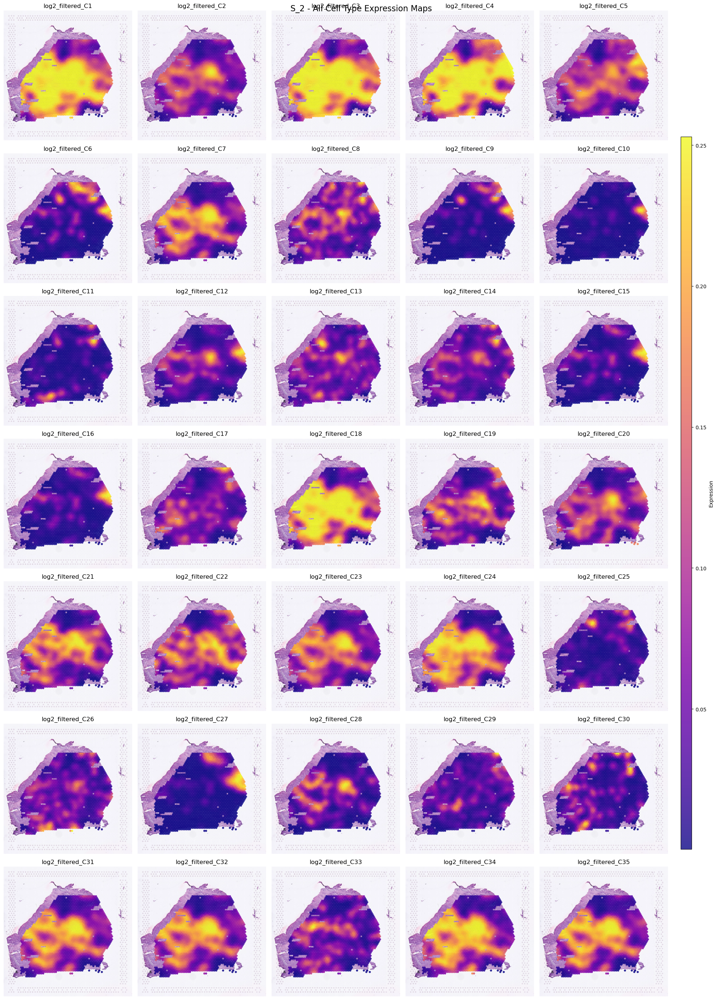

In [18]:
from python_scripts.expression_plot_utils import plot_all_celltypes_on_slide
plot_all_celltypes_on_slide(
    slide_id = "S_2",
    cell_prefix="log2_filtered_",
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="./dataset/gu_smooth_processed_train_spots_log2.h5",
    group_name="log2_Train"
)

/Users/deweywang/Desktop/GitHub/HEVisum/python_scripts/expression_plot_utils.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 1])
/Users/deweywang/Desktop/GitHub/HEVisum/python_scripts/expression_plot_utils.py:53: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 0.93, 1])
/opt/anaconda3/envs/spatialhackathon/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


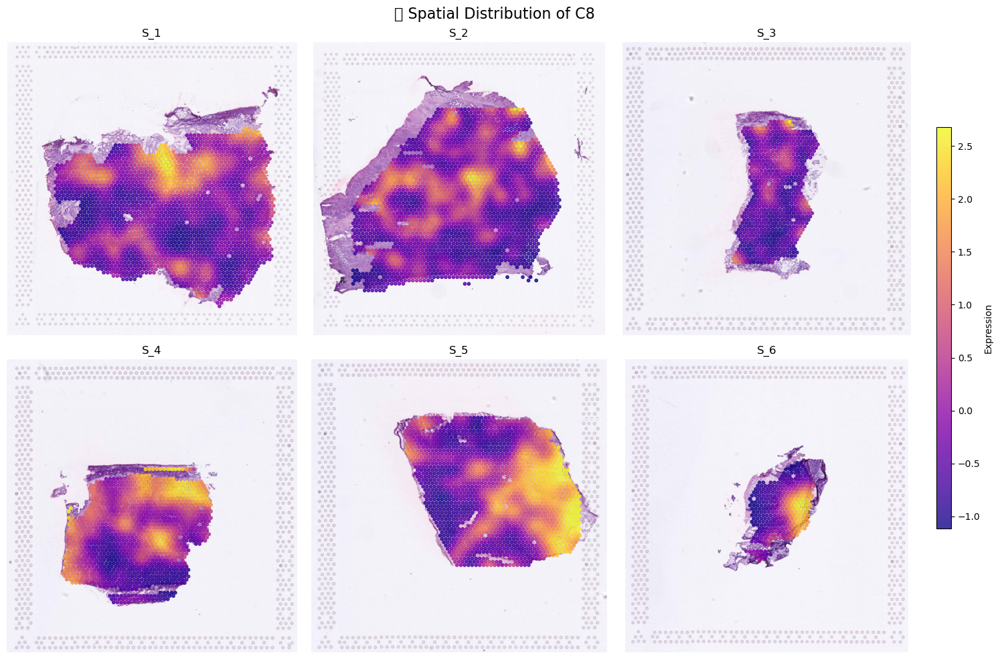

In [26]:
from python_scripts.expression_plot_utils import plot_cell_expression_all_slides
plot_cell_expression_all_slides(
    cell_short_name='C8',
    cell_prefix='zscore_log2_filtered_',
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="./dataset/spots-data/version-4/gu_zscore_processed_train_spots.h5",
    group_name="log2_Train"
)

# gu_smooth_processed_train_spots_log2 , log2_filtered_
# gu_smooth_processed_train_spots , zscore_log2_filtered_

In [6]:
from sklearn.neighbors import KDTree
import numpy as np
import pandas as pd
from python_scripts.spatial_smooth import gaussian_spatial_smoothing
from python_scripts.spatial_smooth import plot_cell_expression_comparison

cell_type_cols = [col for col in train_spot_tables["S_2"].columns if col.startswith("log2_filtered_C")]
smoothed_df = gaussian_spatial_smoothing(train_spot_tables["S_2"], cell_type_cols, radius=80)


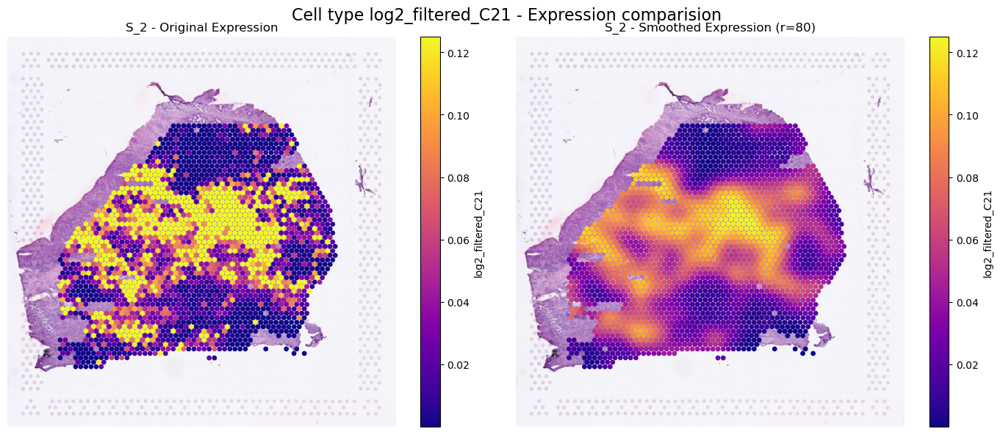

In [10]:
cell_type = "log2_filtered_C21"  # 可以換成任何你要看的 Cx
plot_cell_expression_comparison(
    slide_id="S_2",
    cell_type=cell_type,
    original_df=train_spot_tables["S_2"],
    smoothed_df=smoothed_df,
    radius = 80,
    h5_path="./dataset/elucidata_ai_challenge_data.h5"
)

In [17]:
import h5py
import numpy as np
from python_scripts.spatial_smooth import smooth_all_slides_and_save
# 先載入原本的資料（跟你之前一樣）
with h5py.File("./dataset/processed_train_spots_log2.h5", "r") as f:
    train_spots = f["spots/log2_Train"]
    train_spot_tables = {
        slide: pd.DataFrame(np.array(train_spots[slide]))
        for slide in train_spots.keys()
    }

# 找出所有 cell type 欄位（z-score 後的）
cell_type_cols = [col for col in train_spot_tables["S_1"].columns if col.startswith("log2_filtered_C")]

# 設定儲存路徑
output_path = "./dataset/gu_smooth_processed_train_spots_log2.h5"

# 執行平滑與儲存
smooth_all_slides_and_save(train_spot_tables, cell_type_cols, output_path, radius=80)


Processing slides: 100%|██████████| 6/6 [00:02<00:00,  2.43it/s]

✅ 所有 slide 都已平滑並存成 ./dataset/gu_smooth_processed_train_spots_log2.h5，格式與 processed_train_spots.h5 相同！
